Streaming output truncated to the last 5000 lines.
 extracting: train/labels/110_jpg.rf.d55dc9a4a740e0ac1e65624dfb5c14e6.txt  
 extracting: train/labels/111_jpg.rf.38095c96057cd5a77d140ce961693cb5.txt  
 extracting: train/labels/111_jpg.rf.9fad7462715502eb0bec7f8aa3669114.txt  
 extracting: train/labels/111_jpg.rf.f3df7bb69aee577f98ff0b0a091c0f39.txt  
 extracting: train/labels/113_jpg.rf.1779ea5be0cda8a5a083ee21ee345485.txt  
 extracting: train/labels/113_jpg.rf.17bfb4e1ab781701f6d7f820a7e132d0.txt  
 extracting: train/labels/113_jpg.rf.20c12fc9990f423d12480fb9bef86128.txt  
 extracting: train/labels/113_jpg.rf.4d89daf9ede89d76e15bfe098b79c103.txt  
 extracting: train/labels/113_jpg.rf.6725d2191a8ee61317b2e9d0b907c5e6.txt  
 extracting: train/labels/113_jpg.rf.7249b14a9e72198eef2a774c9095b147.txt  
 extracting: train/labels/113_jpg.rf.78711d9385d29d1739e26dd062c1f088.txt  
 extracting: train/labels/113_jpg.rf.9dbc9890511965d661cd29d17dd549ef.txt  
 extracting: train/labels/113_jpg.rf.

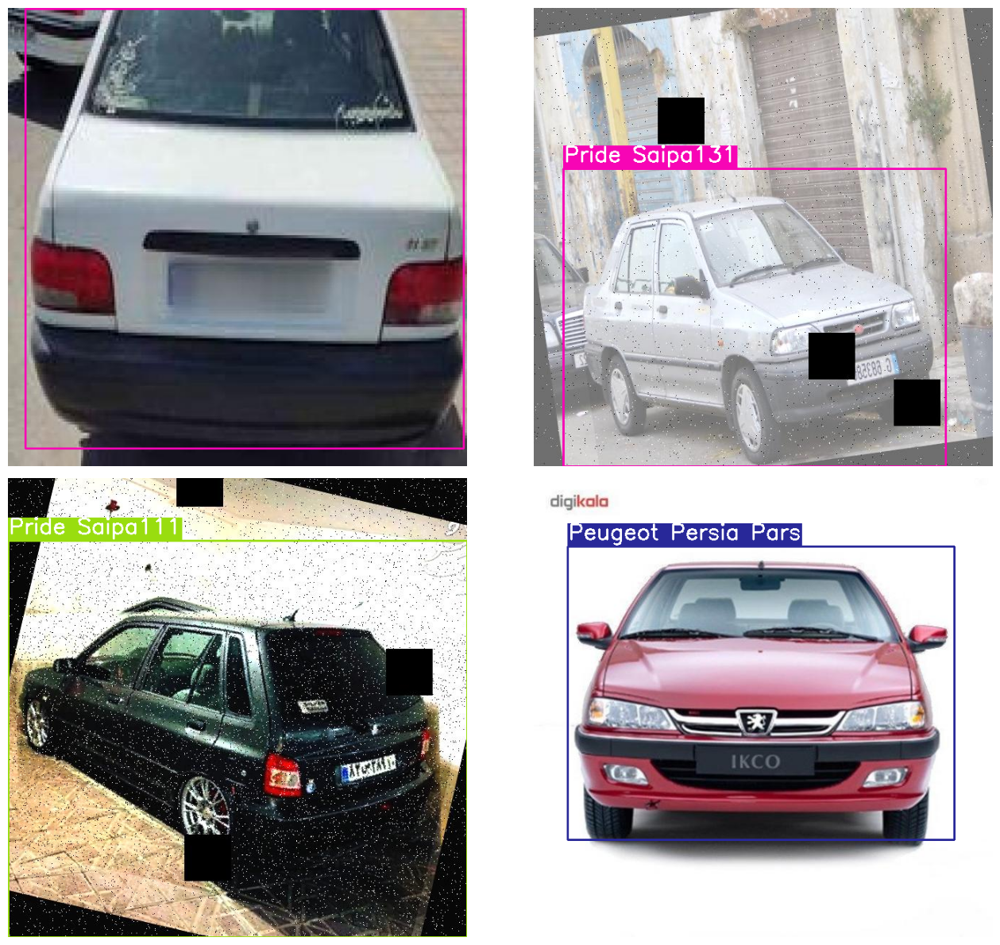

Cloning into 'yolov5'...
remote: Enumerating objects: 15874, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 15874 (delta 47), reused 45 (delta 15), pack-reused 15768
Receiving objects: 100% (15874/15874), 14.69 MiB | 17.97 MiB/s, done.
Resolving deltas: 100% (10856/10856), done.
/content/yolov5
/content/yolov5


<IPython.core.display.Javascript object>

Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor

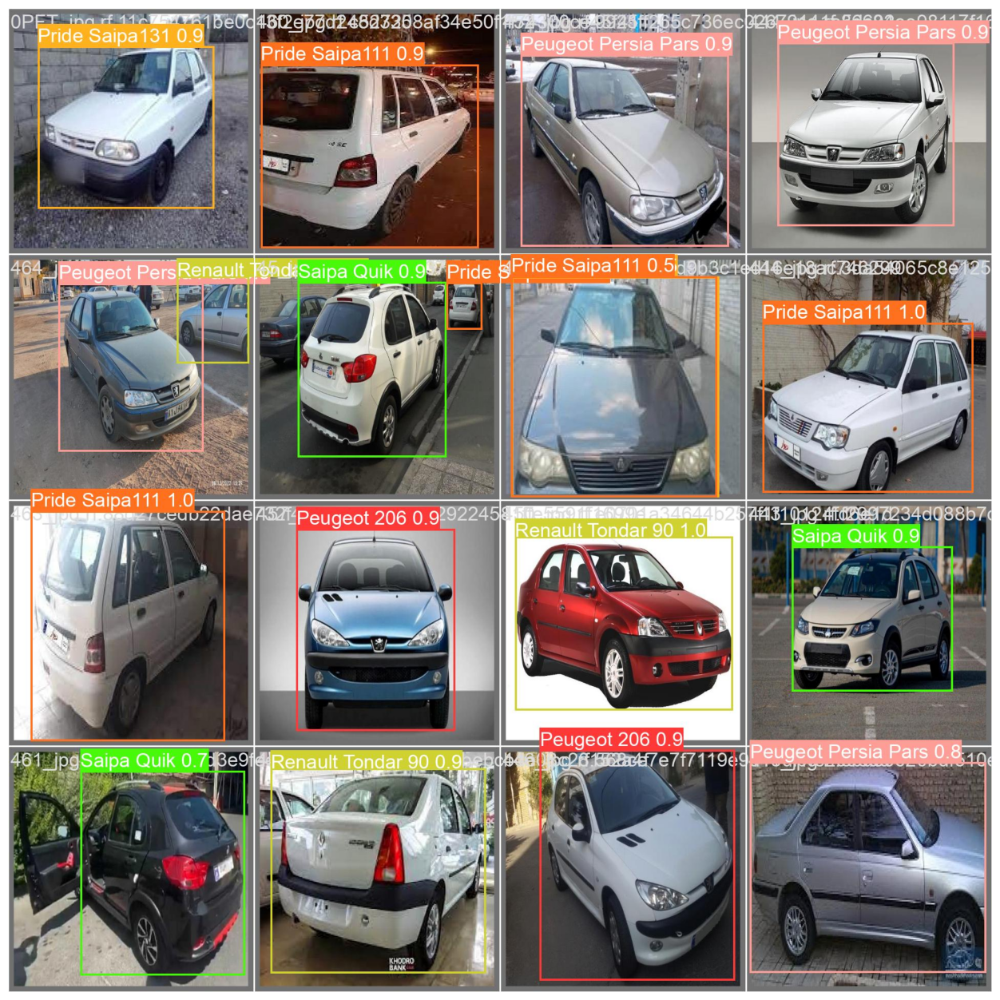

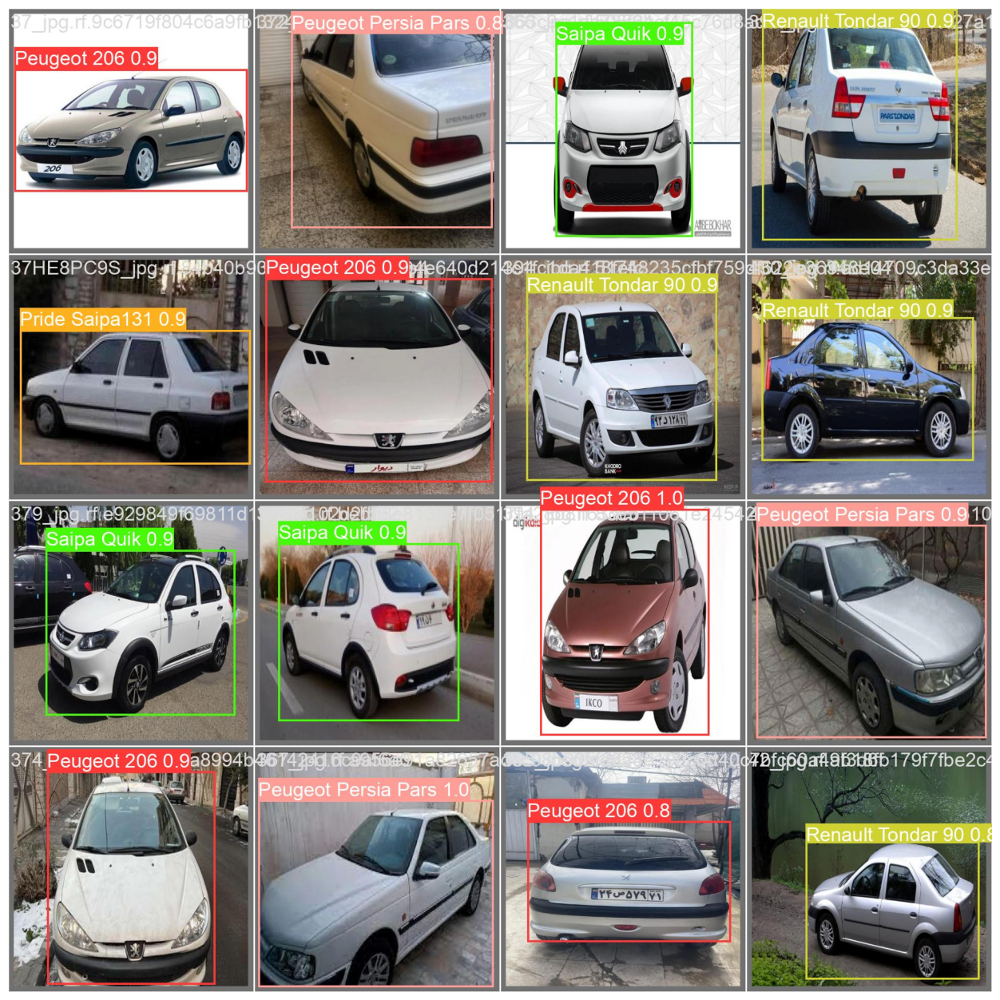

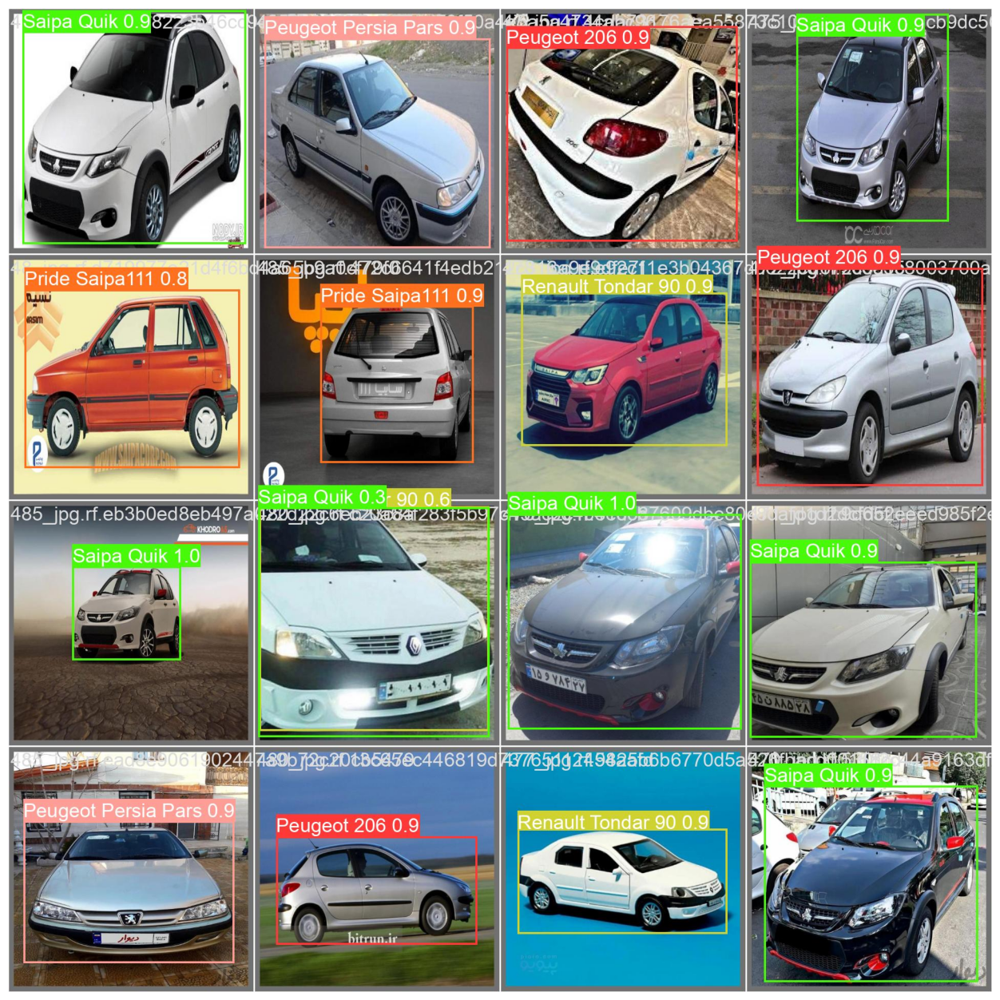

In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

TRAIN = True
# Number of epochs to train for.
EPOCHS = 25

if not os.path.exists('train'):
    !curl -L "https://app.roboflow.com/ds/QN9JSozAQi?key=C3vyH6lgvh" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
    else:
        print('File already present, skipping download...')


class_names = ['Pride Saipa131', 'pars', 'pezho206', 'pride', 'quick', 'tondar']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax


def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin

        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        )

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name,
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image,
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image,
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image


# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()


# Visualize a few training images.
plot(
    image_paths='/content/train/images/*',
    label_paths='/content/train/labels/*',
    num_samples=4,
)



def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR



def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train


if not os.path.exists('/content/drive/MyDrive/yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

%cd yolov5/
!pwd

!pip install -r requirements.txt

monitor_tensorboard()

RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python /content/yolov5/detect.py --weights /content/yolov5/runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR



def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

show_valid_results(RES_DIR)


Current number of inference detection directories: 14
inference_15
detect: weights=['/content/drive/MyDrive/yolov5/runs/train/results_1/weights/best.pt'], source=/content/1.jpg, data=drive/MyDrive/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=drive/MyDrive/yolov5/runs/detect, name=inference_15, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients
image 1/1 /content/1.jpg: 448x640 1 Pride Saipa131, 293.5ms
Speed: 1.4ms pre-process, 293.5ms inference, 1.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to drive/MyDrive/yolov5/runs/detect/inference_15
['/content/drive/MyD

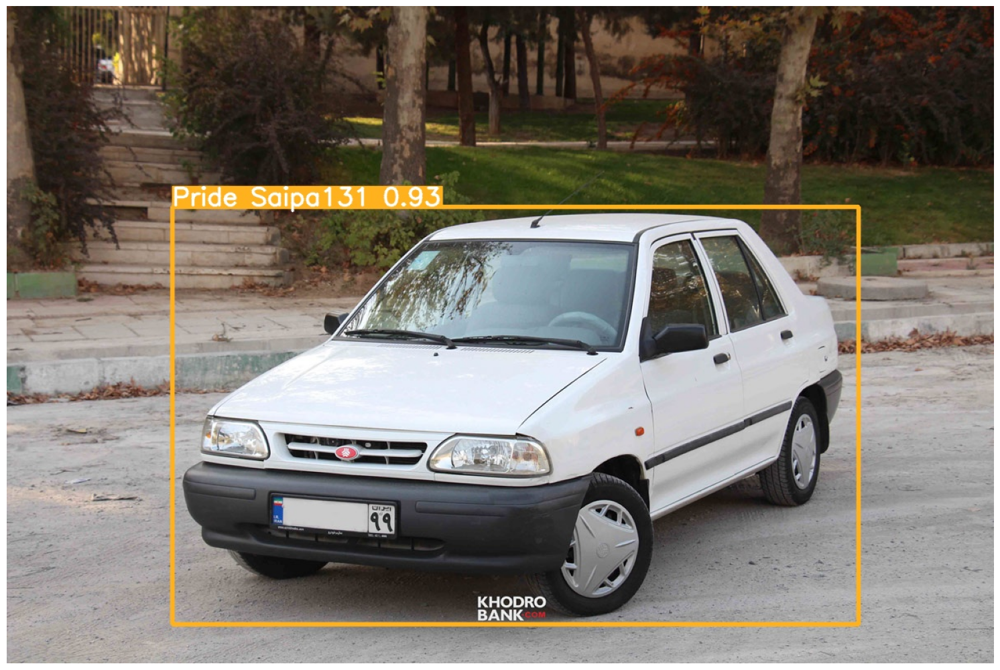

In [ ]:
!pip install ultralytics
#!pip install -r requirements.txt
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import numpy as np

def inference(data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('/content/drive/MyDrive/yolov5/runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/results_1/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR



def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"/content/drive/MyDrive/yolov5/runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()


some = inference('/content/1.jpg')
visualize(some)